In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
from datetime import datetime
from matplotlib.dates import DateFormatter, DayLocator

from IPython.display import clear_output

from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix, classification_report

In [2]:
#custom
from scipy.stats import uniform
from random import randint
C=uniform(loc=0, scale=4);C



# 1. Data import

In [3]:
df_sensor1 = pd.read_csv('data/sensor1.csv')
df_sensor2 = pd.read_csv('data/sensor2.csv')
df_sensor3 = pd.read_csv('data/sensor3.csv')

In [4]:
df_sensor1_legitimate = df_sensor1.drop(['timestamp', 'number_of_packets'], axis=1)
df_sensor2_legitimate = df_sensor2.drop(['timestamp', 'number_of_packets'], axis=1)
df_sensor3_legitimate = df_sensor3.drop(['timestamp', 'number_of_packets'], axis=1)

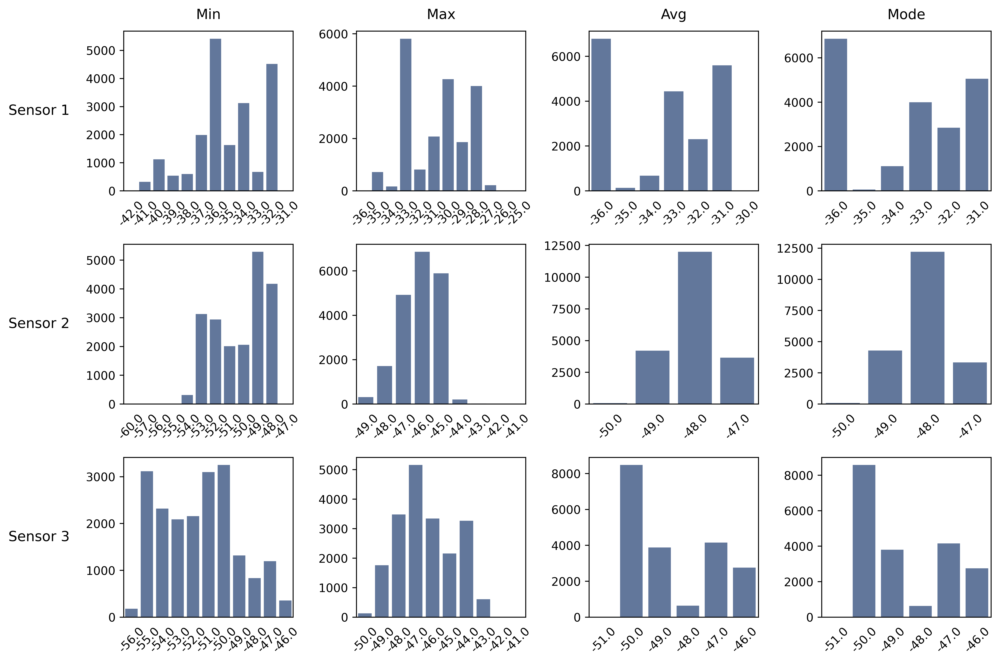

In [5]:
data_dict = {
    "df_sensor1_min_value_counts": df_sensor1['min'].value_counts(),
    "df_sensor1_max_value_counts": df_sensor1['max'].value_counts(),
    "df_sensor1_avg_value_counts": df_sensor1['avg'].round().value_counts(),
    "df_sensor1_mode_value_counts": df_sensor1['mode'].value_counts(),
    "df_sensor2_min_value_counts": df_sensor2['min'].value_counts(),
    "df_sensor2_max_value_counts": df_sensor2['max'].value_counts(),
    "df_sensor2_avg_value_counts": df_sensor2['avg'].round().value_counts(),
    "df_sensor2_mode_value_counts": df_sensor2['mode'].value_counts(),
    "df_sensor3_min_value_counts": df_sensor3['min'].value_counts(),
    "df_sensor3_max_value_counts": df_sensor3['max'].value_counts(),
    "df_sensor3_avg_value_counts": df_sensor3['avg'].round().value_counts(),
    "df_sensor3_mode_value_counts": df_sensor3['mode'].value_counts(),
}

# Define the number of rows and columns for the subplot
nrows = 3
ncols = 4

# Create the subplot figure
fig, axes = plt.subplots(nrows, ncols, figsize=(12, 8), dpi=600)

# Define sensor labels
sensor_labels = ["Sensor 1", "Sensor 2", "Sensor 3"]

# Define row labels (Min, Max, Avg, Mode)
row_labels = ["Min", "Max", "Avg", "Mode"]

# Loop through each dataframe and plot
row_idx = 0
col_idx = 0

for name, data in data_dict.items():
    # Extract data and sort by value (descending) for bar plots
    x = data.index.values
    y = data.values
    sorted_idx = y.argsort()[::-1]  # Sort descending
    x = x[sorted_idx]
    y = y[sorted_idx]

    # Check if it's the first column, then add sensor label
    if col_idx == 0:
        axes[row_idx, col_idx].text(-0.5, 0.5, sensor_labels[row_idx], ha="center", va="center", transform=axes[row_idx, col_idx].transAxes, fontsize=12)

    # Check if it's the first row, then add row label
    if row_idx == 0:
        axes[row_idx, col_idx].text(0.5, 1.1, row_labels[col_idx], ha="center", va="center", transform=axes[row_idx, col_idx].transAxes, fontsize=12, rotation=0)

    # Create bar plot
    sns.barplot(x=x, y=y, ax=axes[row_idx, col_idx], color="#5975A4")

    # Rotate xticklabels by 45 degrees
    axes[row_idx, col_idx].set_xticks(axes[row_idx, col_idx].get_xticks())
    axes[row_idx, col_idx].set_xticklabels(axes[row_idx, col_idx].get_xticklabels(), rotation=45)

    # Remove axis labels and title for subplots (except for bottom row and rightmost column)
    if row_idx < nrows - 1:
        axes[row_idx, col_idx].set_xlabel("")
    if col_idx < ncols - 1:
        axes[row_idx, col_idx].set_ylabel("")
    axes[row_idx, col_idx].set_title("")

    # Adjust layout
    axes[row_idx, col_idx].tick_params(bottom=False)
    plt.tight_layout()

    # Move to next position
    col_idx += 1
    if col_idx >= ncols:
        col_idx = 0
        row_idx += 1

# 2. Data preparation

In [6]:
df_sensor1_legitimate['legitimate'] = 1
df_sensor2_legitimate['legitimate'] = 1
df_sensor3_legitimate['legitimate'] = 1

In [7]:
def get_all_ranges(avg_step=0.5):
    list_of_ranges = []
    for i in range(-100, 0):
        for j in range(i, 0):
            for k in range(i, j+1):
                m = i
                while (m < j):
                    list_of_ranges.append((i, j, m, k))
                    m+=avg_step

    return pd.DataFrame(list_of_ranges, columns=['min', 'max', 'avg', 'mode'])

In [8]:
sample_illegitimate = get_all_ranges()
sample_illegitimate['legitimate'] = 0

In [9]:
sensor1_min_from_min_index = df_sensor1['min'].idxmin()
sensor1_max_from_min_index = df_sensor1['min'].idxmax()

sensor1_min_from_max_index = df_sensor1['max'].idxmin()
sensor1_max_from_max_index = df_sensor1['max'].idxmax()

sensor1_min_from_avg_index = df_sensor1['avg'].idxmin()
sensor1_max_from_avg_index = df_sensor1['avg'].idxmax()

sensor1_min_from_mode_index = df_sensor1['mode'].idxmin()
sensor1_max_from_mode_index = df_sensor1['mode'].idxmax()

sensor1_df_illegitimate = sample_illegitimate[
            ~(sample_illegitimate['min'].between(int(df_sensor1.loc[sensor1_min_from_min_index]['min'])-5, int(df_sensor1.loc[sensor1_max_from_min_index]['min'])+5)) |
            ~(sample_illegitimate['max'].between(int(df_sensor1.loc[sensor1_min_from_max_index]['max'])-5, int(df_sensor1.loc[sensor1_max_from_max_index]['max'])+5)) |
            ~(sample_illegitimate['avg'].between(int(df_sensor1.loc[sensor1_min_from_avg_index]['avg'])-5, int(df_sensor1.loc[sensor1_max_from_avg_index]['avg'])+5)) |
            ~(sample_illegitimate['mode'].between(int(df_sensor1.loc[sensor1_min_from_mode_index]['mode'])-5, int(df_sensor1.loc[sensor1_max_from_mode_index]['mode'])+5))
        ]

In [10]:
sensor2_min_from_min_index = df_sensor2['min'].idxmin()
sensor2_max_from_min_index = df_sensor2['min'].idxmax()

sensor2_min_from_max_index = df_sensor2['max'].idxmin()
sensor2_max_from_max_index = df_sensor2['max'].idxmax()

sensor2_min_from_avg_index = df_sensor2['avg'].idxmin()
sensor2_max_from_avg_index = df_sensor2['avg'].idxmax()

sensor2_min_from_mode_index = df_sensor2['mode'].idxmin()
sensor2_max_from_mode_index = df_sensor2['mode'].idxmax()

sensor2_df_illegitimate = sample_illegitimate[
            ~(sample_illegitimate['min'].between(int(df_sensor2.loc[sensor2_min_from_min_index]['min'])-5, int(df_sensor2.loc[sensor2_max_from_min_index]['min'])+5)) |
            ~(sample_illegitimate['max'].between(int(df_sensor2.loc[sensor2_min_from_max_index]['max'])-5, int(df_sensor2.loc[sensor2_max_from_max_index]['max'])+5)) |
            ~(sample_illegitimate['avg'].between(int(df_sensor2.loc[sensor2_min_from_avg_index]['avg'])-5, int(df_sensor2.loc[sensor2_max_from_avg_index]['avg'])+5)) |
            ~(sample_illegitimate['mode'].between(int(df_sensor2.loc[sensor2_min_from_mode_index]['mode'])-5, int(df_sensor2.loc[sensor2_max_from_mode_index]['mode'])+5))
        ]

In [11]:
sensor3_min_from_min_index = df_sensor3['min'].idxmin()
sensor3_max_from_min_index = df_sensor3['min'].idxmax()

sensor3_min_from_max_index = df_sensor3['max'].idxmin()
sensor3_max_from_max_index = df_sensor3['max'].idxmax()

sensor3_min_from_avg_index = df_sensor3['avg'].idxmin()
sensor3_max_from_avg_index = df_sensor3['avg'].idxmax()

sensor3_min_from_mode_index = df_sensor3['mode'].idxmin()
sensor3_max_from_mode_index = df_sensor3['mode'].idxmax()

sensor3_df_illegitimate = sample_illegitimate[
            ~(sample_illegitimate['min'].between(int(df_sensor3.loc[sensor3_min_from_min_index]['min'])-5, int(df_sensor3.loc[sensor3_max_from_min_index]['min'])+5)) |
            ~(sample_illegitimate['max'].between(int(df_sensor3.loc[sensor3_min_from_max_index]['max'])-5, int(df_sensor3.loc[sensor3_max_from_max_index]['max'])+5)) |
            ~(sample_illegitimate['avg'].between(int(df_sensor3.loc[sensor3_min_from_avg_index]['avg'])-5, int(df_sensor3.loc[sensor3_max_from_avg_index]['avg'])+5)) |
            ~(sample_illegitimate['mode'].between(int(df_sensor3.loc[sensor3_min_from_mode_index]['mode'])-5, int(df_sensor3.loc[sensor3_max_from_mode_index]['mode'])+5))
        ]

In [12]:
df_sensor1_prepared = pd.concat([sensor1_df_illegitimate, df_sensor1_legitimate], axis=0).reset_index(drop=True);df_sensor1_prepared

,min,max,avg,mode,legitimate
0,-100.0,-99.0,-100.000000,-100.0,0
1,-100.0,-99.0,-99.500000,-100.0,0
2,-100.0,-99.0,-100.000000,-99.0,0
3,-100.0,-99.0,-99.500000,-99.0,0
4,-100.0,-98.0,-100.000000,-100.0,0
...,...,...,...,...,...
16952112,-32.0,-28.0,-31.247019,-31.0,1
16952113,-34.0,-28.0,-31.114140,-31.0,1
16952114,-34.0,-28.0,-31.149915,-31.0,1
16952115,-35.0,-28.0,-31.139693,-31.0,1


In [13]:
df_sensor2_prepared = pd.concat([sensor2_df_illegitimate, df_sensor2_legitimate], axis=0).reset_index(drop=True)

In [14]:
df_sensor3_prepared = pd.concat([sensor3_df_illegitimate, df_sensor3_legitimate], axis=0).reset_index(drop=True)

# 3. Data Visualization

In [15]:
sns.set(font_scale=1.4, font="Times New Roman", style="whitegrid", rc={"figure.dpi":300, 'savefig.dpi':300})
markers = {0: '.', 1: 'X'}

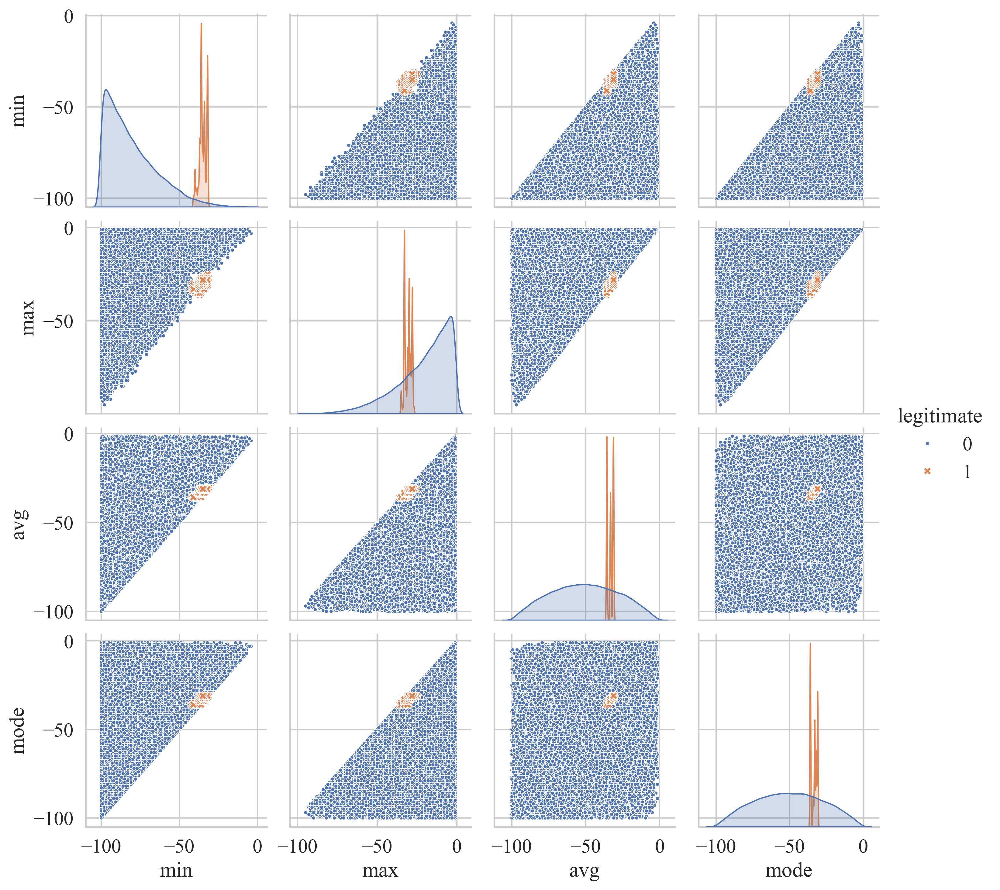

In [16]:
sns.pairplot(pd.concat([sensor1_df_illegitimate.sample(120000), df_sensor1_legitimate], axis=0).reset_index(drop=True), hue='legitimate', vars=['min', 'max', 'avg', 'mode'], markers=markers)

[Text(0, 0.5, 'min'),
 Text(0, 1.5, 'max'),
 Text(0, 2.5, 'avg'),
 Text(0, 3.5, 'mode'),
 Text(0, 4.5, 'legitimate')]

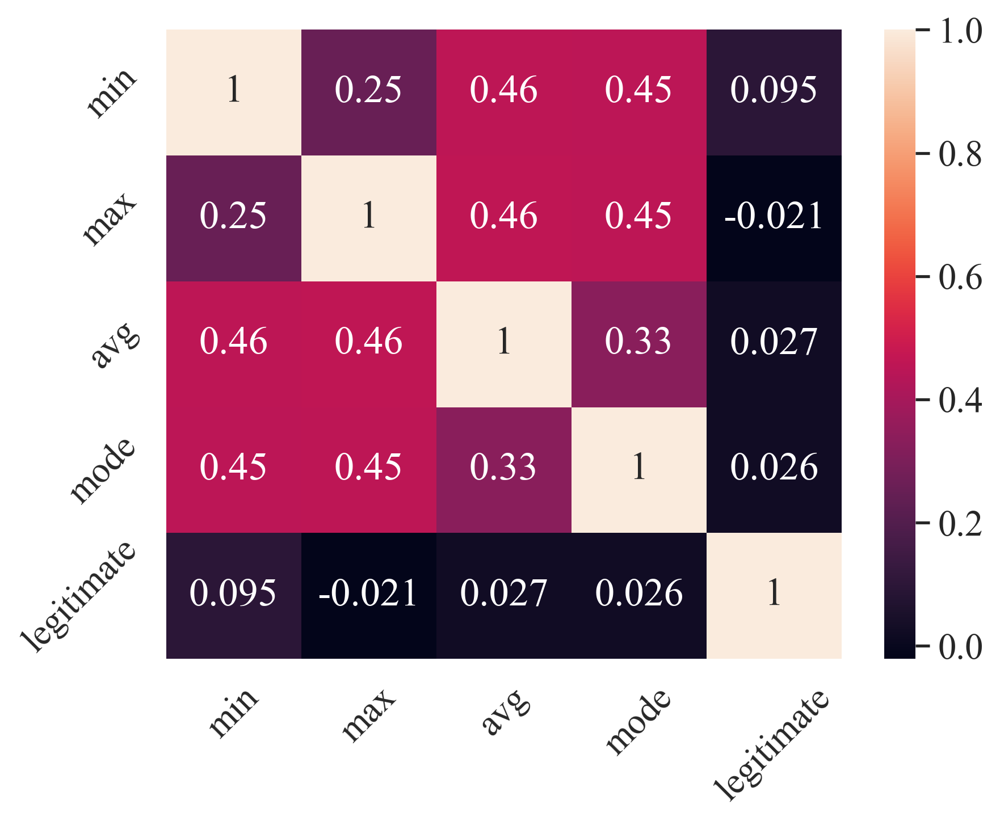

In [17]:
g = sns.heatmap(df_sensor1_prepared.corr(), annot=True)
g.set_xticklabels(g.get_xticklabels(), rotation = 45)
g.set_yticklabels(g.get_yticklabels(), rotation = 45)

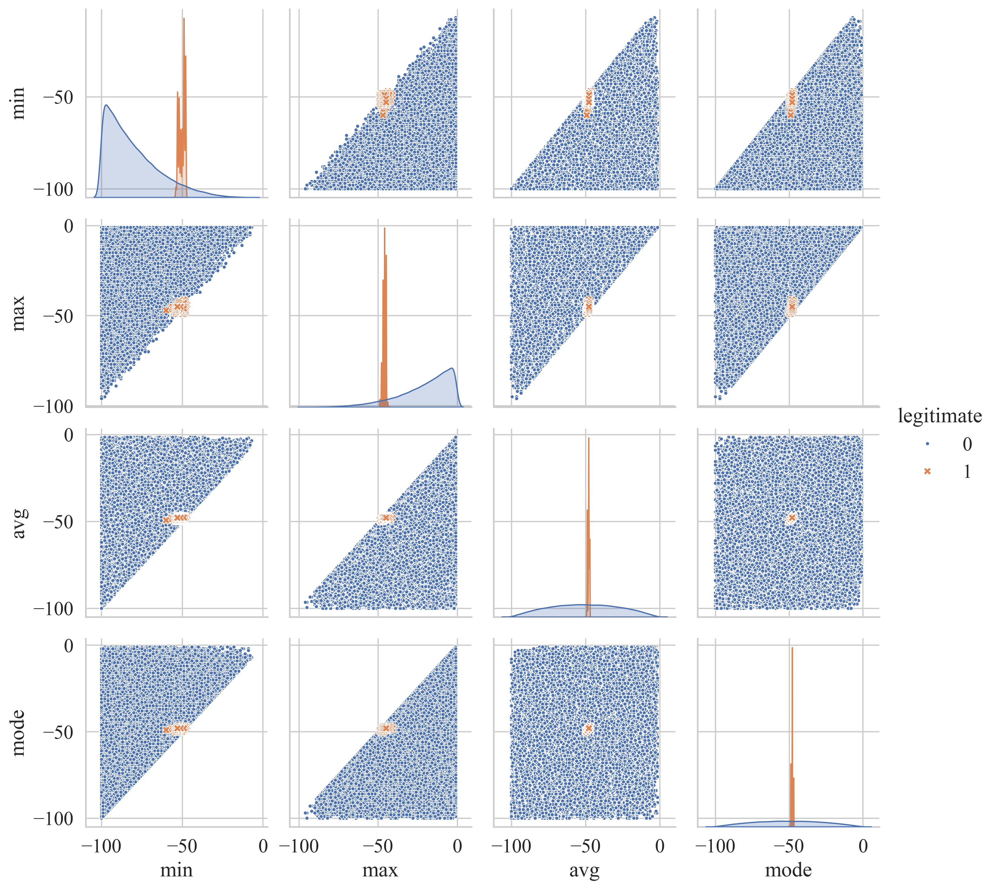

In [18]:
sns.pairplot(pd.concat([sensor2_df_illegitimate.sample(120000), df_sensor2_legitimate], axis=0).reset_index(drop=True), hue='legitimate', vars=['min', 'max', 'avg', 'mode'], markers=markers)

[Text(0, 0.5, 'min'),
 Text(0, 1.5, 'max'),
 Text(0, 2.5, 'avg'),
 Text(0, 3.5, 'mode'),
 Text(0, 4.5, 'legitimate')]

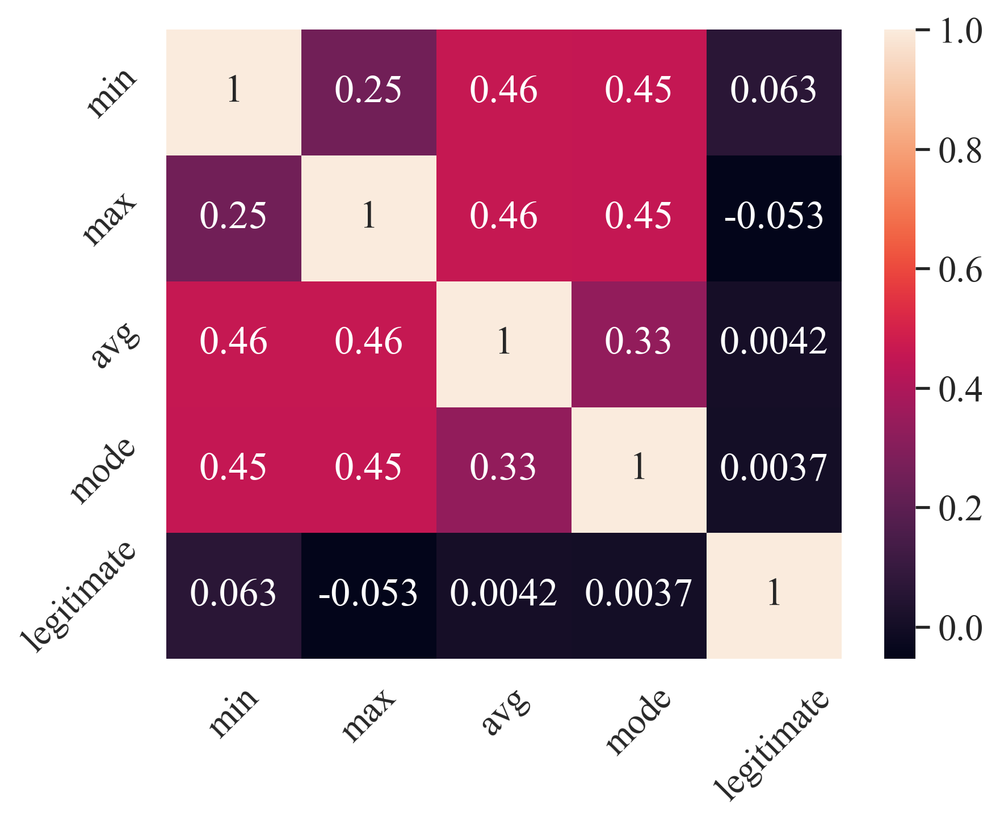

In [19]:
g = sns.heatmap(df_sensor2_prepared.corr(), annot=True)
g.set_xticklabels(g.get_xticklabels(), rotation = 45)
g.set_yticklabels(g.get_yticklabels(), rotation = 45)

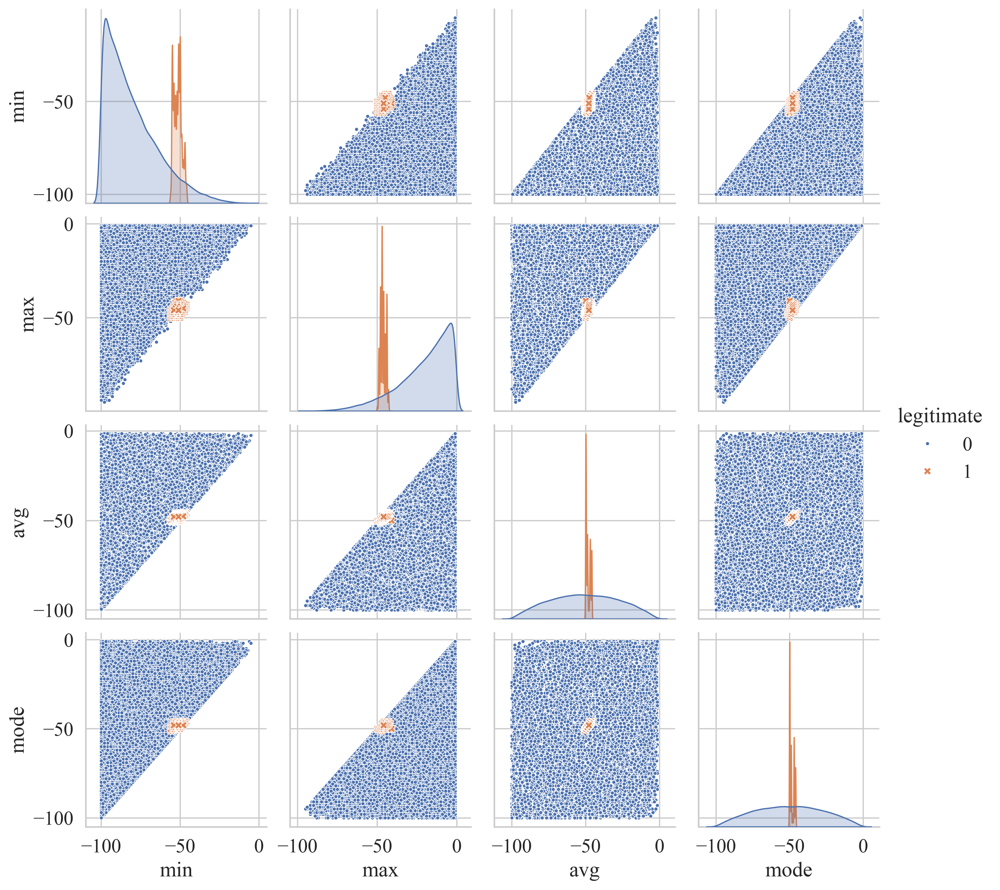

In [20]:
sns.pairplot(pd.concat([sensor3_df_illegitimate.sample(120000), df_sensor3_legitimate], axis=0).reset_index(drop=True), hue='legitimate', vars=['min', 'max', 'avg', 'mode'], markers=markers)

[Text(0, 0.5, 'min'),
 Text(0, 1.5, 'max'),
 Text(0, 2.5, 'avg'),
 Text(0, 3.5, 'mode'),
 Text(0, 4.5, 'legitimate')]

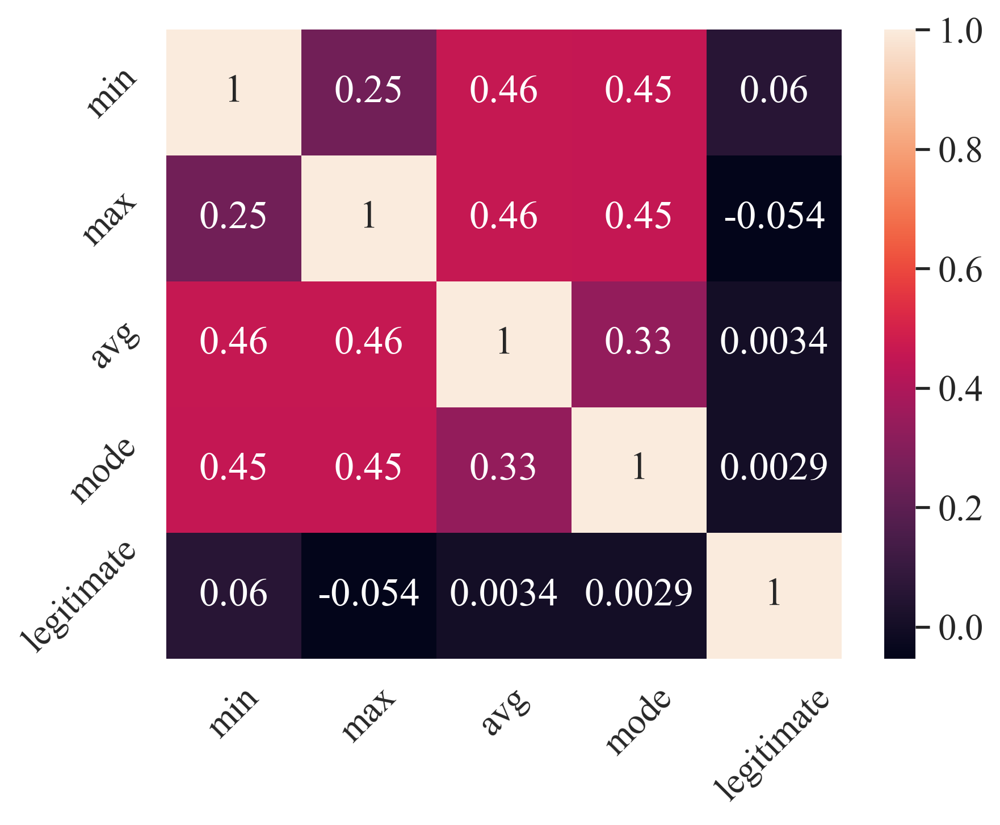

In [21]:
g = sns.heatmap(df_sensor3_prepared.corr(), annot=True)
g.set_xticklabels(g.get_xticklabels(), rotation = 45)
g.set_yticklabels(g.get_yticklabels(), rotation = 45)

# 4. Training/Testing split sensor1

In [22]:
sensor1_X = df_sensor1_prepared.drop(['legitimate'], axis=1)

In [23]:
sensor1_y = df_sensor1_prepared['legitimate']

In [24]:
sensor1_X_train, sensor1_X_test, sensor1_y_train, sensor1_y_test = train_test_split(sensor1_X, sensor1_y, test_size=0.2)

# 4.1. TRAINING THE MODEL

In [25]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, ConfusionMatrixDisplay
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from scipy.stats import randint


In [26]:
#RANDOM FOREST
# param_dist = {'n_estimators': randint(50,500),
#               'max_depth': randint(1,20)}

# # Create a random forest classifier
# rf_s1 = RandomForestClassifier()

# # Use random search to find the best hyperparameters
# rand_search_s1 = RandomizedSearchCV(rf_s1, 
#                                  param_distributions = param_dist, 
#                                  n_iter=5, 
#                                  cv=5)

# # Fit the random search object to the data
# rand_search_s1.fit(sensor1_X_train, sensor1_y_train)

In [27]:
# # Create a variable for the best model
# best_rf_s1 = rand_search_s1.best_estimator_

# # Print the best hyperparameters
# print('Best hyperparameters:',  rand_search_s1.best_params_)

In [28]:
#///
# sensor1_classifier = RandomForestClassifier(max_depth=10, n_estimators=100, criterion="log_loss")
# sensor1_classifier.fit(sensor1_X_train, sensor1_y_train)

In [29]:
# sensor1_classifier = KNeighborsClassifier(n_neighbors=11, metric='minkowski', p=2, weights='distance') 
# sensor1_classifier.fit(sensor1_X_train, sensor1_y_train)

In [30]:
# SVM
from sklearn import svm

In [31]:
# #Create a svm Classifier
# sensor1_classifier = svm.SVC(kernel='linear') # Linear Kernel

# #Train the model using the training sets
# sensor1_classifier.fit(sensor1_X_train, sensor1_y_train)

# #Predict the response for test dataset
# # y_pred = clf.predict(X_test)

In [32]:
from sklearn.svm import LinearSVC

In [33]:
sensor1_classifier = LinearSVC() # Linear Kernel
sensor1_classifier.fit(sensor1_X_train, sensor1_y_train)

LinearSVC()

In [34]:
sensor1_y_pred = sensor1_classifier.predict(sensor1_X_test)

# 4.2. EVALUATING THE MODEL

In [35]:
sensor1_cm = confusion_matrix(sensor1_y_test, sensor1_y_pred)

<Axes: >

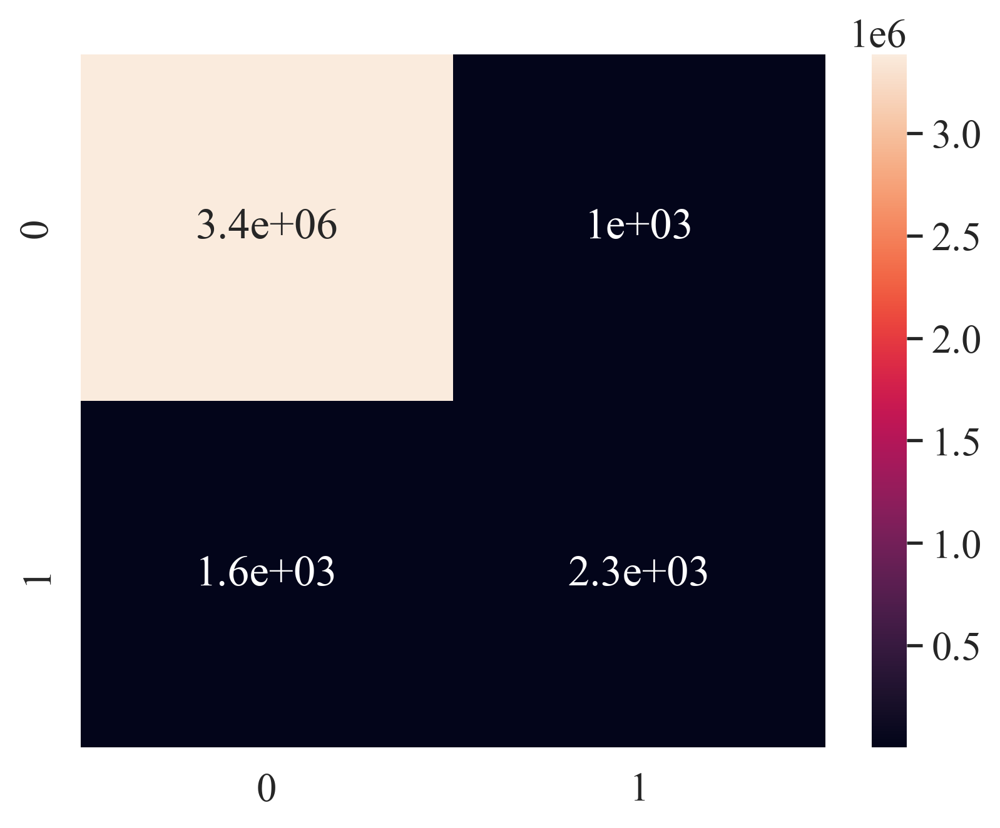

In [36]:
sns.set(font_scale=1.4, font="Times New Roman")
sns.heatmap(sensor1_cm, annot=True)

In [37]:
print(classification_report(sensor1_y_test, sensor1_y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00   3386533
           1       0.70      0.60      0.64      3891

    accuracy                           1.00   3390424
   macro avg       0.85      0.80      0.82   3390424
weighted avg       1.00      1.00      1.00   3390424



# 4.3. Test prediction on the real data durring the attack

In [38]:
df_sensor1_attack = pd.read_csv('data/attack_sensor1.csv')

In [39]:
number_of_packets = pd.DataFrame()
number_of_packets['sensor1'] = df_sensor1_attack['number_of_packets']

In [40]:
df_sensor1_attack = df_sensor1_attack.drop(['timestamp', 'number_of_packets'], axis=1)

In [41]:
sensor1_verification_prediction = sensor1_classifier.predict(df_sensor1_attack)

In [42]:
sensor1_verification_prediction

array([0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1])

# 5. Training/Testing split sensor2

In [43]:
sensor2_X = df_sensor2_prepared.drop(['legitimate'], axis=1)

In [44]:
sensor2_y = df_sensor2_prepared['legitimate']

In [45]:
sensor2_X_train, sensor2_X_test, sensor2_y_train, sensor2_y_test = train_test_split(sensor2_X, sensor2_y, test_size=0.2)

# 5.1. TRAINING THE MODEL

In [46]:
# sensor2_classifier = RandomForestClassifier(max_depth=10, n_estimators=100, criterion="log_loss")
# sensor2_classifier.fit(sensor2_X_train, sensor2_y_train)

In [47]:
sensor2_classifier = LinearSVC()
sensor2_classifier.fit(sensor2_X_train, sensor2_y_train)

LinearSVC()

In [48]:
# sensor2_classifier = KNeighborsClassifier(n_neighbors=11, metric='minkowski', p=2, weights='distance')
# sensor2_classifier.fit(sensor2_X_train, sensor2_y_train)

In [49]:
sensor2_y_pred = sensor2_classifier.predict(sensor2_X_test)

# 5.2. EVALUATING THE MODEL

In [50]:
sensor2_cm = confusion_matrix(sensor2_y_test, sensor2_y_pred)

<Axes: >

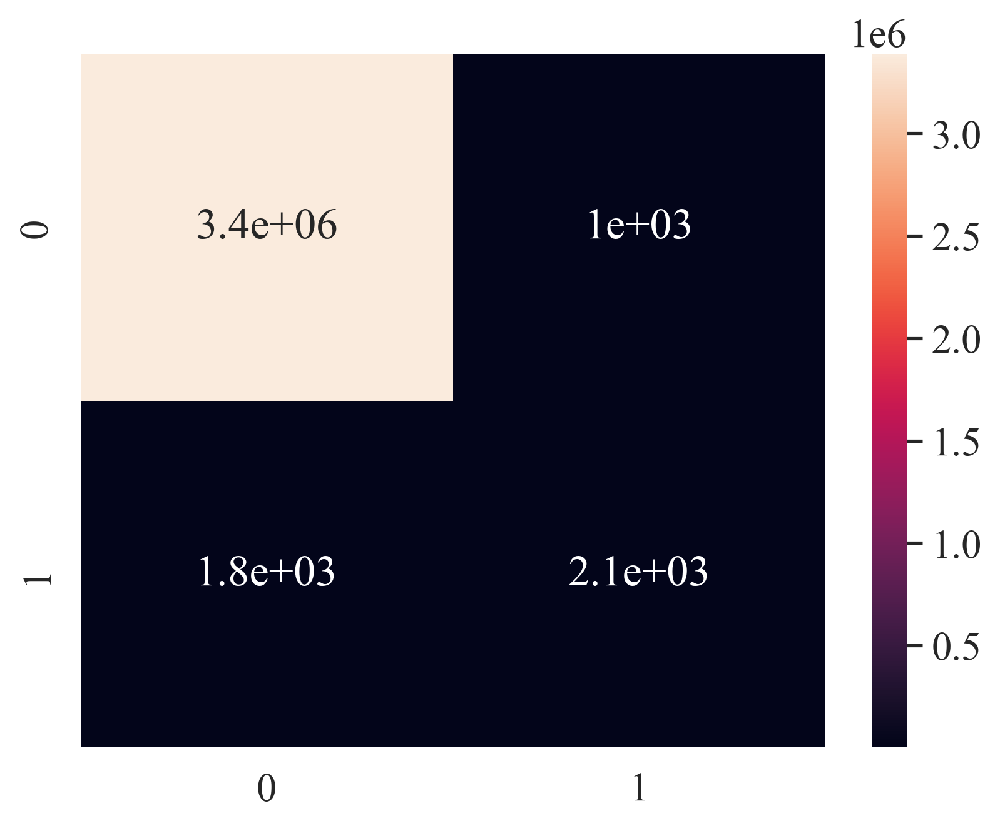

In [51]:
sns.set(font_scale=1.4, font="Times New Roman")
sns.heatmap(sensor2_cm, annot=True)

In [52]:
print(classification_report(sensor2_y_test, sensor2_y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00   3388055
           1       0.67      0.53      0.59      3933

    accuracy                           1.00   3391988
   macro avg       0.83      0.77      0.80   3391988
weighted avg       1.00      1.00      1.00   3391988



# 5.3. Test prediction on the real data durring the attack

In [53]:
df_sensor2_attack = pd.read_csv('data/attack_sensor2.csv')

In [54]:
number_of_packets['sensor2'] = df_sensor2_attack['number_of_packets']

In [55]:
df_sensor2_attack = df_sensor2_attack.drop(['timestamp', 'number_of_packets'], axis=1)

In [56]:
sensor2_verification_prediction = sensor2_classifier.predict(df_sensor2_attack)

In [57]:
sensor2_verification_prediction

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 1])

# 6. Training/Testing split sensor3

In [58]:
sensor3_X = df_sensor3_prepared.drop(['legitimate'], axis=1)

In [59]:
sensor3_y = df_sensor3_prepared['legitimate']

In [60]:
sensor3_X_train, sensor3_X_test, sensor3_y_train, sensor3_y_test = train_test_split(sensor3_X, sensor3_y, test_size=0.2)

# 6.1. TRAINING THE MODEL

In [61]:
# sensor3_classifier = RandomForestClassifier(max_depth=10, n_estimators=100, criterion="log_loss")
# sensor3_classifier.fit(sensor3_X_train, sensor3_y_train)

In [62]:
sensor3_classifier = LinearSVC()
sensor3_classifier.fit(sensor3_X_train, sensor3_y_train)

LinearSVC()

In [63]:
# sensor3_classifier = KNeighborsClassifier(n_neighbors=11, metric='minkowski', p=2, weights='distance')
# sensor3_classifier.fit(sensor3_X_train, sensor3_y_train)

In [64]:
sensor3_y_pred = sensor3_classifier.predict(sensor3_X_test)

# 6.2. EVALUATING THE MODEL

In [65]:
sensor3_cm = confusion_matrix(sensor3_y_test, sensor3_y_pred)

<Axes: >

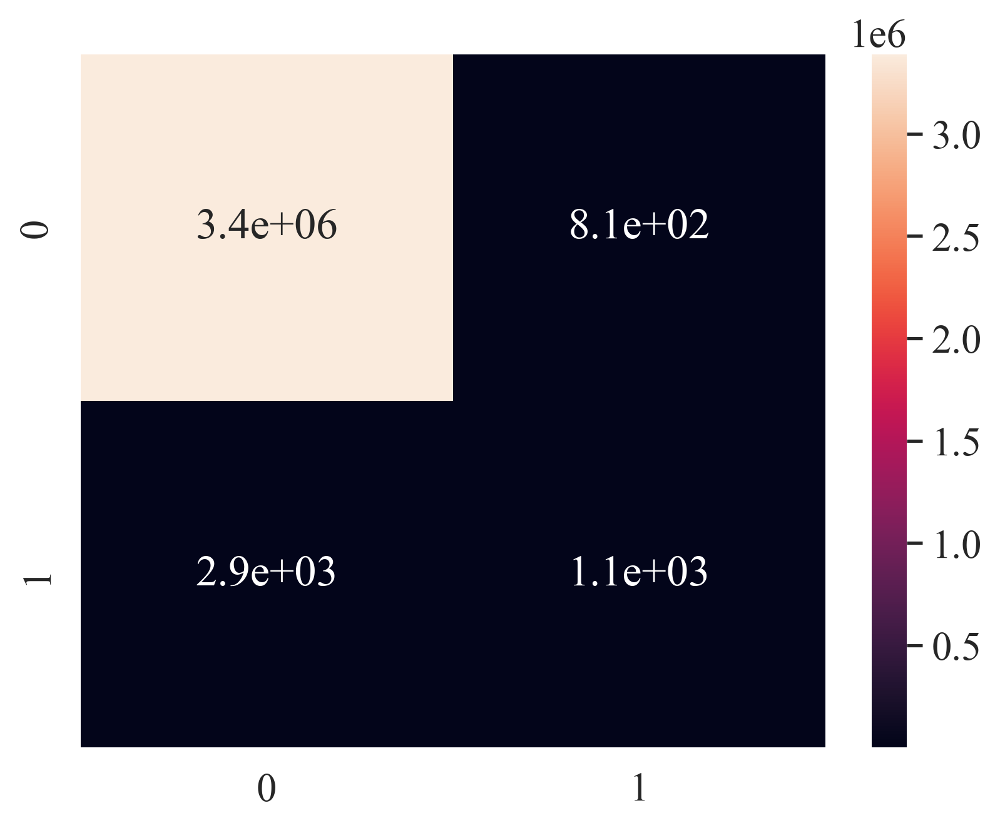

In [66]:
sns.set(font_scale=1.4, font="Times New Roman")
sns.heatmap(sensor3_cm, annot=True)

In [67]:
print(classification_report(sensor3_y_test, sensor3_y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00   3389276
           1       0.58      0.28      0.38      3989

    accuracy                           1.00   3393265
   macro avg       0.79      0.64      0.69   3393265
weighted avg       1.00      1.00      1.00   3393265



# 6.3. Test prediction on the real data durring the attack

In [68]:
df_sensor3_attack = pd.read_csv('data/attack_sensor3.csv')

In [69]:
number_of_packets['sensor3'] = df_sensor3_attack['number_of_packets']

In [70]:
df_sensor3_attack = df_sensor3_attack.drop(['timestamp', 'number_of_packets'], axis=1)

In [71]:
sensor3_verification_prediction = sensor3_classifier.predict(df_sensor3_attack)

In [72]:
sensor3_verification_prediction

array([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 0])

# 7. Detection visualization

In [73]:
# Inverse 0 to 1 and 1 to 0
sensor1_reverse_verification_prediction = 1 - sensor1_verification_prediction
sensor2_reverse_verification_prediction = 1 - sensor2_verification_prediction
sensor3_reverse_verification_prediction = 1 - sensor3_verification_prediction

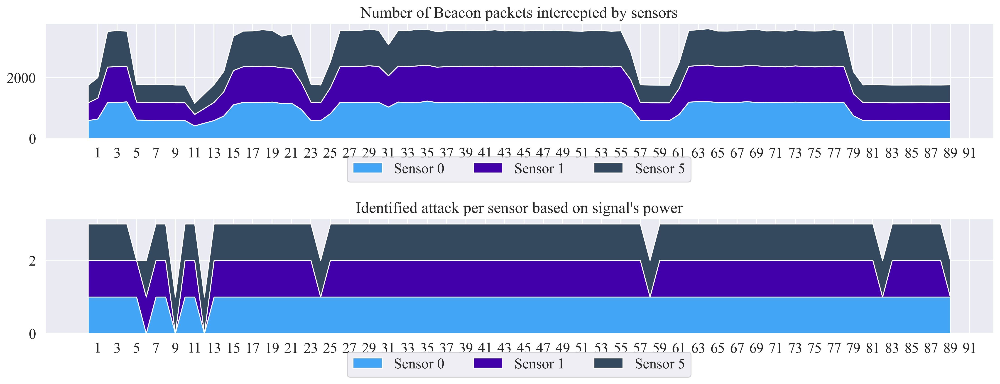

In [74]:
x1 = range(0, 90)
y1 = [number_of_packets['sensor1'].tolist()[:90], number_of_packets['sensor2'].tolist()[:90], number_of_packets['sensor3'].tolist()[:90]]

# Data for the second plot
min_len = 90
x2 = range(0, min_len)
y2 = [
    sensor1_reverse_verification_prediction.tolist()[:90],
    sensor2_reverse_verification_prediction.tolist()[:90],
    sensor3_reverse_verification_prediction.tolist()[:90]
]

# Create a figure and subplots
fig, axs = plt.subplots(2, 1, figsize=(15, 6))

# Plot the first subplot
axs[0].stackplot(x1, y1, labels=['Sensor 0', 'Sensor 1', 'Sensor 5'], colors=["#42A5F5", "#4200AB", "#34495e"])
axs[0].legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, ncol=5)
axs[0].set_title('Number of Beacon packets intercepted by sensors')
axs[0].set_xticks(range(1, 92, 2))

# Plot the second subplot
axs[1].stackplot(x2, y2, labels=['Sensor 0', 'Sensor 1', 'Sensor 5'], colors=["#42A5F5", "#4200AB", "#34495e"])
axs[1].legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, ncol=5)
axs[1].set_title("Identified attack per sensor based on signal's power")
axs[1].set_xticks(range(1, 92, 2))

plt.tight_layout()
plt.show()